### Clean Juneau Snow Depth Timeseries Data 

Notebook contents 
* Load the Powder Patch & Tram data from Synoptic, then combine with the SNOTEL "Heen" Data here 
* Lightly clean, and provide smoothed options, then plot and save to a csv to open for more plotting later

created by Cassie Lumbrazo\
last updated: March 2026\
run location: UAS linux\
python environment: **interactive**

In [1]:
# import packages 
%matplotlib inline

# plotting packages 
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns 

sns.set_theme()
plt.rcParams['figure.figsize'] = [12,6] #overriding size

# data packages 
import pandas as pd
import numpy as np
import xarray as xr
from datetime import datetime

import scipy

In [2]:
from matplotlib.patches import Patch
from matplotlib.colors import ListedColormap
from matplotlib import ticker

In [3]:
pwd

'/home/cassie/python/repos/snowdepth_teleconnections'

# Load Data

### SNOTEL Data first loaded in `2_snotel_data.ipynb`

In [4]:
filename = '/hdd/snow_hydrology/met_station/snotel/heenlatinee/site1270_hourly_2016_2026.nc' # this is everything until 20 March 2026

# open the netcdf 
ds_heen = xr.open_dataset(filename)
ds_heen

<xarray.Dataset> Size: 8MB
Dimensions:   (datetime: 83296)
Coordinates:
  * datetime  (datetime) datetime64[ns] 666kB 2015-10-01 ... 2026-03-20T08:00:00
Data variables:
    site_id   (datetime) int32 333kB ...
    swe       (datetime) float64 666kB ...
    precip1   (datetime) float64 666kB ...
    precip2   (datetime) float64 666kB ...
    temp      (datetime) float64 666kB ...
    hs        (datetime) float64 666kB ...
    bat       (datetime) float64 666kB ...
    wdir      (datetime) float64 666kB ...
    ws_x      (datetime) float64 666kB ...
    ws_v      (datetime) float64 666kB ...
    rh        (datetime) float64 666kB ...
    pres      (datetime) float64 666kB ...

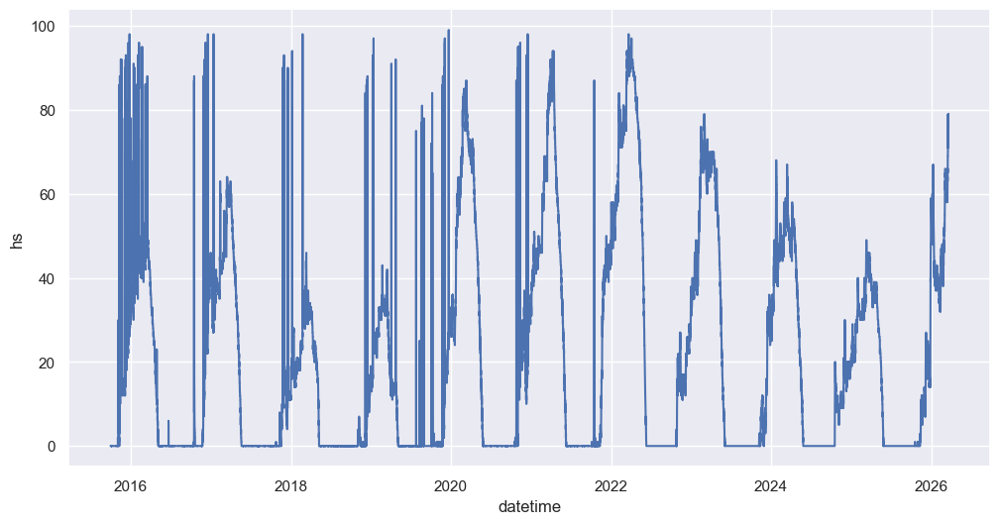

In [5]:
ds_heen['hs'].plot()

### Load Tram Data - Synoptic CSV

In [6]:
# filename = '/hdd/snow_hydrology/met_station/tram/JTMA2_MountRoberts_Tram_Synoptic_everything_utc_until_2025-10-08.csv'
filename = '/hdd/snow_hydrology/met_station/tram/JTMA2.2026-03-20.csv' # this one is everything downloaded until 20 March 2026 
df_tram = pd.read_csv(filename, sep = ",", low_memory=False, skiprows=10)
df_tram['datetime'] = pd.to_datetime(df_tram['Date_Time'], utc=True)
# set datetime as the index
df_tram = df_tram.iloc[1:].copy() # skipping that first row since it's the units row
df_tram.set_index('datetime', inplace=True)
df_tram.head()

,Station_ID,Date_Time,air_temp_set_1,relative_humidity_set_1,wind_speed_set_1,wind_direction_set_1,wind_gust_set_1,snow_depth_set_1,solar_radiation_set_1,precip_accum_set_1,volt_set_1,snow_interval_set_1,wind_chill_set_1d,wind_cardinal_direction_set_1d,heat_index_set_1d,dew_point_temperature_set_1d
datetime,,,,,,,,,,,,,,,,
2014-08-27 03:00:00+00:00,JTMA2,2014-08-27T03:00:00Z,8.92,100.0,NaN,NaN,NaN,NaN,NaN,1.524,NaN,NaN,NaN,NaN,NaN,8.92
2014-08-27 03:15:00+00:00,JTMA2,2014-08-27T03:15:00Z,8.9,100.0,NaN,NaN,NaN,NaN,NaN,0.508,NaN,NaN,NaN,NaN,NaN,8.9
2014-08-27 03:30:00+00:00,JTMA2,2014-08-27T03:30:00Z,8.83,100.0,NaN,NaN,NaN,NaN,NaN,0.508,NaN,NaN,NaN,NaN,NaN,8.83
2014-08-27 03:45:00+00:00,JTMA2,2014-08-27T03:45:00Z,8.8,100.0,NaN,NaN,NaN,NaN,NaN,0.508,NaN,NaN,NaN,NaN,NaN,8.8
2014-08-27 04:00:00+00:00,JTMA2,2014-08-27T04:00:00Z,8.8,100.0,NaN,NaN,NaN,NaN,NaN,0.762,NaN,NaN,NaN,NaN,NaN,8.8


<Axes: xlabel='datetime'>

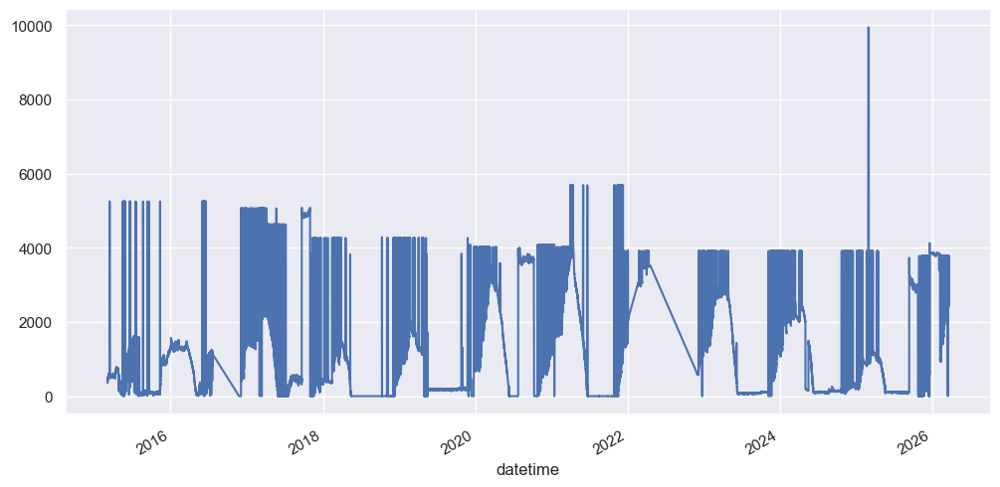

In [7]:
df_tram['snow_depth_set_1'] = pd.to_numeric(df_tram['snow_depth_set_1'], errors='coerce')
df_tram['snow_depth_set_1'].plot()

<Axes: xlabel='datetime'>

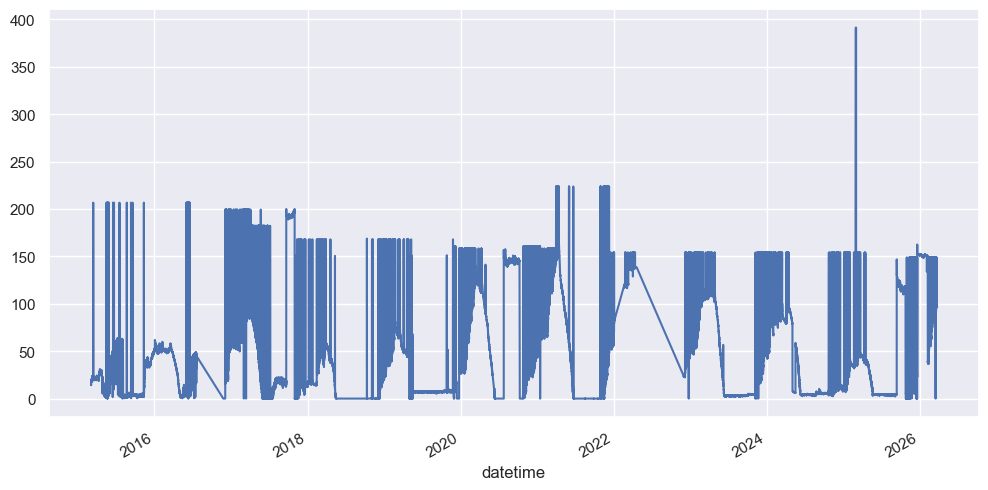

In [8]:
# convert mm to inches 
df_tram['snow_depth_set_1_inches'] = df_tram['snow_depth_set_1'] / 25.4  # convert mm to inches
df_tram['snow_depth_set_1_inches'].plot()

<Axes: xlabel='datetime'>

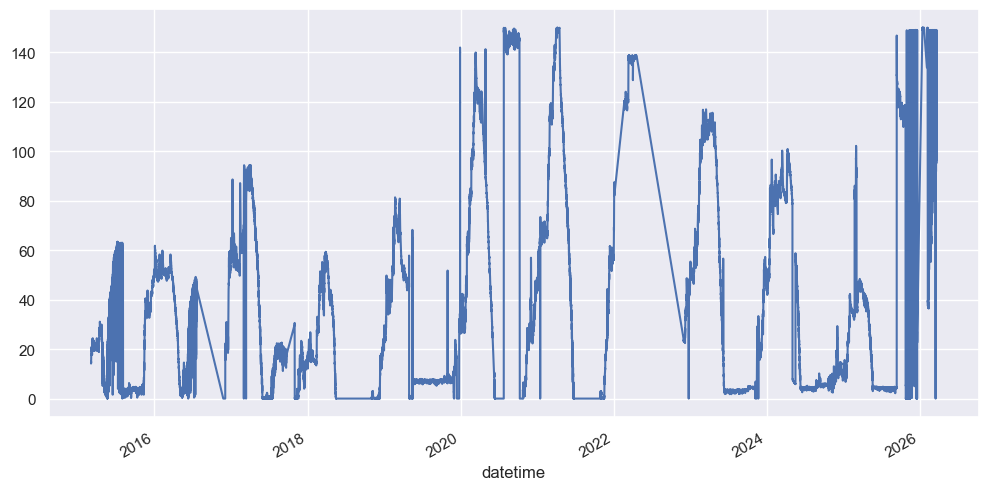

In [9]:
# drop any values above 150 and below 0 
df_tram_clean = df_tram[(df_tram['snow_depth_set_1_inches'] <= 150) & (df_tram['snow_depth_set_1_inches'] >= 0)]
df_tram_clean['snow_depth_set_1_inches'].plot()

<Axes: xlabel='datetime'>

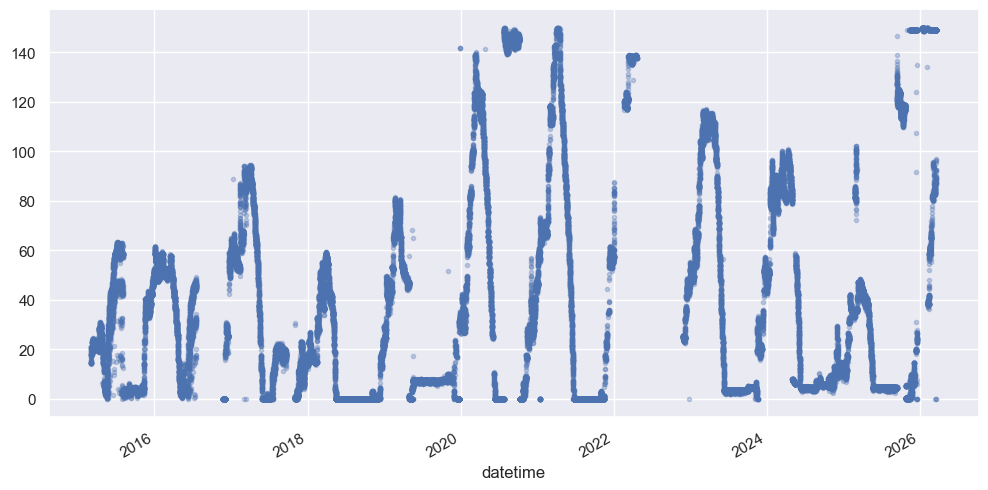

In [10]:
df_tram_clean['snow_depth_set_1_inches'].plot(marker='.', linestyle='None', alpha=0.3)

In [11]:
# create a interactive plot to look at the data
import plotly.express as px
fig = px.scatter(df_tram_clean, x=df_tram_clean.index, y='snow_depth_set_1_inches', title='Mount Roberts Tram Snow Depth Set 1 (inches)')   
fig.show()

## Try Manual Cleaning

In [12]:
# save only the snow depth column and datetime index to a new dataframe, save datetime to a column name as well
df_tram_manual = df_tram_clean[['snow_depth_set_1_inches']].copy()

# now reset the index and save the current index to a column named 'datetime'
df_tram_manual.reset_index(inplace=True)

# and rename the column to 'snow_depth_inches'
df_tram_manual.rename(columns={'snow_depth_set_1_inches': 'snow_depth_inches'}, inplace=True)
df_tram_manual.head()

,datetime,snow_depth_inches
0,2015-03-04 01:00:00+00:00,14.57
1,2015-03-04 02:00:00+00:00,14.57
2,2015-03-04 03:00:00+00:00,14.57
3,2015-03-04 04:00:00+00:00,14.57
4,2015-03-04 05:00:00+00:00,14.57


In [13]:
import plotly.graph_objects as go
import pandas as pd

def interactive_timeseries_cleaner(df, time_col='datetime', value_col='snow_depth_inches'):
    """
    Interactive cleaner:
    - Click points to remove them
    - Updates plot live
    - Returns cleaned dataframe
    """

    df_clean = df.copy().reset_index(drop=True)

    fig = go.FigureWidget(
        data=[go.Scatter(
            x=df_clean[time_col],
            y=df_clean[value_col],
            mode='markers+lines',
            marker=dict(size=6),
            name='snow depth'
        )]
    )

    scatter = fig.data[0]

    removed_points = []

    def on_click(trace, points, selector):
        nonlocal df_clean, removed_points

        if not points.point_inds:
            return

        inds = sorted(points.point_inds, reverse=True)

        print(f"Removing {len(inds)} points")

        removed_points.extend(df_clean.loc[inds, time_col].tolist())

        df_clean = df_clean.drop(inds).reset_index(drop=True)

        # Update plot
        scatter.x = df_clean[time_col]
        scatter.y = df_clean[value_col]

    scatter.on_click(on_click)

    display(fig)

    return lambda: df_clean, lambda: removed_points

In [ ]:
# get_clean_df, get_removed = interactive_timeseries_cleaner(df_tram_manual)

FigureWidget({
    'data': [{'marker': {'size': 6},
              'mode': 'markers+lines',
              'name': 'snow depth',
              'type': 'scatter',
              'uid': '6c46c4e2-a646-4751-9a6b-915485b3df36',
              'x': array(['2015-03-04T01:00:00.000000', '2015-03-04T02:00:00.000000',
                          '2015-03-04T03:00:00.000000', ..., '2026-03-20T07:00:00.000000',
                          '2026-03-20T08:00:00.000000', '2026-03-20T09:00:00.000000'],
                         shape=(78969,), dtype='datetime64[us]'),
              'y': {'bdata': ('pHA9CtcjLUCkcD0K1yMtQKRwPQrXIy' ... 'fhehSeYkCuR+F6FJ5iQFK4HoXroWJA'),
                    'dtype': 'f8'}}],
    'layout': {'template': '...'}
})

In [ ]:
df_cleaned = get_clean_df()
removed_times = get_removed()

## Previous --------------

In [12]:
# Replace snow depth values >30 in June–October with NaN
df_tram_clean.loc[df_tram_clean.index.month.isin([5]) & (df_tram_clean['snow_depth_set_1_inches'] > 50), 'snow_depth_set_1_inches'] = np.nan
summer_months = [7, 8, 9]
df_tram_clean.loc[df_tram_clean.index.month.isin(summer_months) & (df_tram_clean['snow_depth_set_1_inches'] > 2), 'snow_depth_set_1_inches'] = np.nan

# also remove values for september and october which are over 50 inches 
df_tram_clean.loc[df_tram_clean.index.month.isin([10]) & (df_tram_clean['snow_depth_set_1_inches'] > 50), 'snow_depth_set_1_inches'] = np.nan

In [13]:
# remove any values in 2025 which are above 60 inches 
# df_tram_clean.loc[df_tram_clean.index.year == 2025 & (df_tram_clean['snow_depth_set_1_inches'] > 60), 'snow_depth_set_1_inches'] = np.nan # this time has the parantheses wrong... 
df_tram_clean.loc[(df_tram_clean.index.year == 2025) & (df_tram_clean['snow_depth_set_1_inches'] > 60), 'snow_depth_set_1_inches'] = np.nan

fig = px.scatter(df_tram_clean, x=df_tram_clean.index, y='snow_depth_set_1_inches', title='Mount Roberts Tram Snow Depth Set 1 (inches)')   
fig.show()

### Load Powder Patch (PPSA) from Synoptic CSV

In [14]:
# filename = '/home/cassie/data/fishcreek/mesowest/rawdata/PPSA2_Synoptic_everything_utc_time_remove_header.csv'
filename = '/hdd/snow_hydrology/met_station/ppsa2/PPSA2.2026-03-20.csv'
df_ppsa = pd.read_csv(filename, sep = ",", low_memory=False, skiprows=10)

# Convert 'Date_Time' to datetime, skipping the first row (units row)
df_ppsa = df_ppsa.iloc[1:].copy()
df_ppsa['datetime'] = pd.to_datetime(df_ppsa['Date_Time'], utc=True)
# set datetime as the index
df_ppsa = df_ppsa.iloc[1:].copy() # skipping that first row since it's the units row
df_ppsa.set_index('datetime', inplace=True)
df_ppsa.head()

,Station_ID,Date_Time,air_temp_set_1,relative_humidity_set_1,snow_depth_set_1,precip_accum_set_1,volt_set_1,snow_interval_set_1,heat_index_set_1d,dew_point_temperature_set_1d
datetime,,,,,,,,,,
2014-01-09 15:30:00+00:00,PPSA2,2014-01-09T15:30:00Z,-1.38,92.0,NaN,NaN,NaN,NaN,NaN,-2.53
2014-01-09 16:00:00+00:00,PPSA2,2014-01-09T16:00:00Z,-1.38,91.9,NaN,NaN,NaN,NaN,NaN,-2.54
2014-01-09 16:30:00+00:00,PPSA2,2014-01-09T16:30:00Z,-1.38,91.9,NaN,NaN,NaN,NaN,NaN,-2.54
2014-01-09 17:00:00+00:00,PPSA2,2014-01-09T17:00:00Z,-1.38,91.8,NaN,NaN,NaN,NaN,NaN,-2.56
2014-01-09 17:30:00+00:00,PPSA2,2014-01-09T17:30:00Z,-1.38,91.8,NaN,NaN,NaN,NaN,NaN,-2.56


<Axes: xlabel='datetime'>

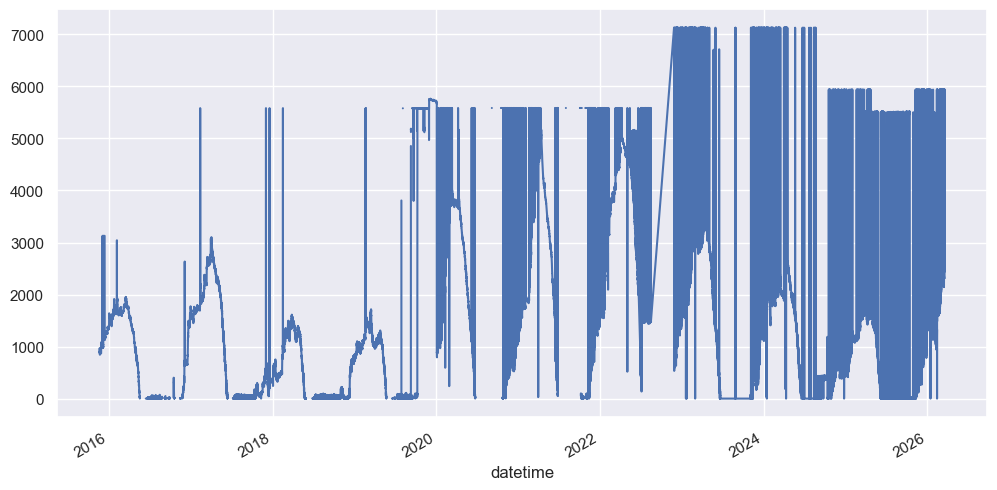

In [15]:
df_ppsa['snow_depth_set_1'] = pd.to_numeric(df_ppsa['snow_depth_set_1'], errors='coerce')
df_ppsa['snow_depth_set_1'].plot()

In [16]:
# convert mm to inches 
df_ppsa['snow_depth_set_1_inches'] = df_ppsa['snow_depth_set_1'] / 25.4  # convert mm to inches

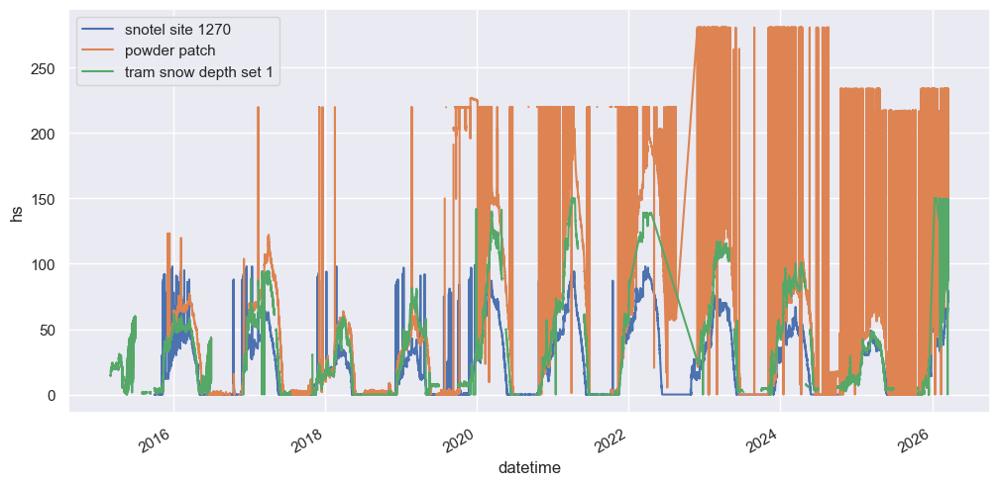

In [17]:
ds_heen['hs'].plot()
df_ppsa['snow_depth_set_1_inches'].plot()
df_tram_clean['snow_depth_set_1_inches'].plot()

plt.legend(['snotel site 1270', 'powder patch', 'tram snow depth set 1'])

## Combine Snow Depth Data from 3 Sites into One Dataframe

Fix timezones for everything to make timezone naive so that we can combine into a single dataset 

In [18]:
# first, make both dataframes timezone-naive so that we can join 
df_ppsa_native = df_ppsa.copy()
df_ppsa_native.index = df_ppsa_native.index.tz_localize(None)
df_ppsa_native.index.name = 'datetime'

df_tram_naive = df_tram_clean.copy()
df_tram_naive.index = df_tram_naive.index.tz_localize(None)
df_tram_naive.index.name = 'datetime'

ds_heen_pandas = ds_heen.to_dataframe()
ds_heen_pandas.index = ds_heen_pandas.index.tz_localize(None)

ds_heen_pandas = ds_heen_pandas[~ds_heen_pandas.index.duplicated(keep='first')]
df_ppsa_native = df_ppsa_native[~df_ppsa_native.index.duplicated(keep='first')]
df_tram_naive = df_tram_naive[~df_tram_naive.index.duplicated(keep='first')]

In [19]:
df_snow = pd.concat(
    [
        ds_heen_pandas['hs'].rename('heen'),
        df_ppsa_native['snow_depth_set_1_inches'].rename('ppsa'),
        df_tram_naive['snow_depth_set_1_inches'].rename('tram')
    ],
    axis=1
)


<Axes: xlabel='datetime'>

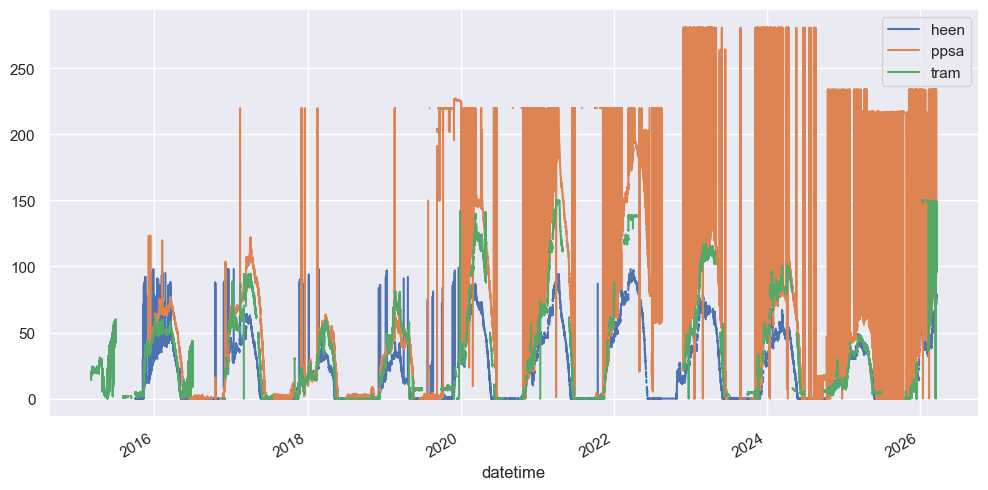

In [20]:
df_snow.plot()

<Axes: xlabel='datetime'>

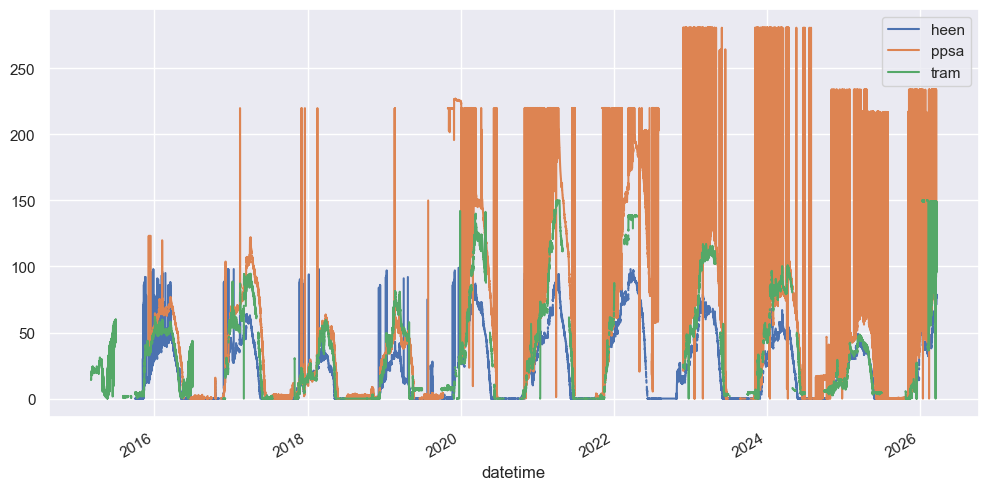

In [21]:
# Replace snow depth values >50 in August–September-October with NaN
summer_months = [8, 9, 10]
df_snow.loc[df_snow.index.month.isin(summer_months) & (df_snow['ppsa'] > 50), 'ppsa'] = np.nan
df_snow.loc[df_snow.index.month.isin(summer_months) & (df_snow['heen'] > 50), 'heen'] = np.nan
df_snow.loc[df_snow.index.month.isin(summer_months) & (df_snow['tram'] > 50), 'tram'] = np.nan
df_snow.plot()

<Axes: xlabel='datetime'>

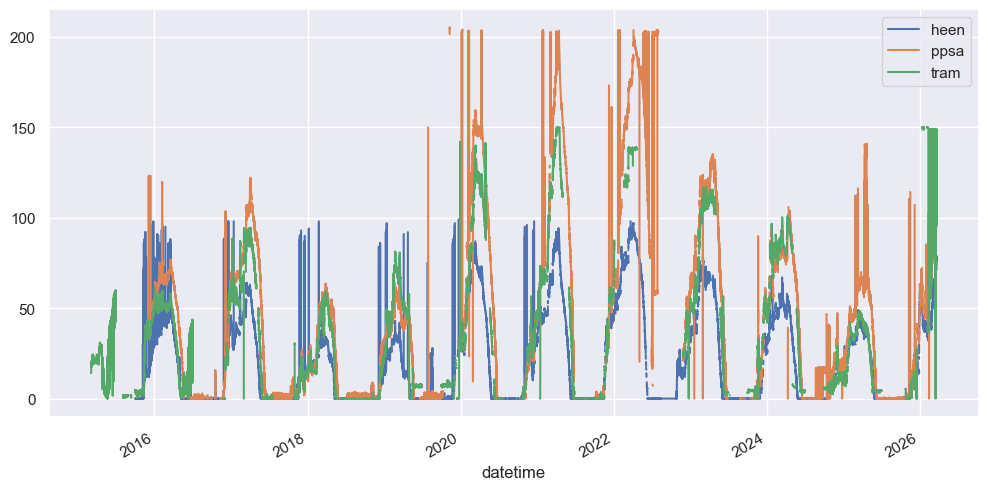

In [22]:
# and remove all values above 210, make nan 
df_snow.loc[df_snow['ppsa'] > 210, 'ppsa'] = np.nan
df_snow.loc[df_snow['heen'] > 210, 'heen'] = np.nan
df_snow.plot()

# Data Cleaning

Clean up max values for each water year and variable to start...

In [23]:
# 1: Define water year from datetime index ---
def water_year(dt):
    """Return the water year for a given datetime (Oct–Sep)."""
    return dt.year + 1 if dt.month >= 10 else dt.year

df_snow['WY'] = df_snow.index.map(water_year)

# 2: Define max allowable values per year ---
max_values = {
    2016: {'ppsa': 90, 'heen': 60, 'tram': 150},
    2017: {'ppsa': 130, 'heen': 70, 'tram': 150},
    2018: {'ppsa': 70, 'heen': 50, 'tram': 150},
    2019: {'ppsa': 80, 'heen': 50, 'tram': 140},
    2020: {'ppsa': 170, 'heen': 85, 'tram': 140},
    2021: {'ppsa': 200, 'heen': 95, 'tram': 150},
    2022: {'ppsa': 200, 'heen': 100, 'tram': 150},
    2023: {'ppsa': 150, 'heen': 100, 'tram': 150},
    2024: {'ppsa': 150, 'heen': 60, 'tram': 150},
    2025: {'ppsa': 100, 'heen': 60, 'tram': 60},
    2026: {'ppsa': 100, 'heen': 60, 'tram': 60},
}

# 3: Apply thresholds per water year ---
def apply_thresholds(row):
    wy = row['WY']
    if wy in max_values:
        thresholds = max_values[wy]
        # replace with NaN if exceeding threshold
        if row['ppsa'] > thresholds['ppsa']:
            row['ppsa'] = np.nan
        if row['heen'] > thresholds['heen']:
            row['heen'] = np.nan
        if row['tram'] > thresholds['tram']:
            row['tram'] = np.nan
    return row

df_snow = df_snow.apply(apply_thresholds, axis=1)

<Axes: xlabel='datetime'>

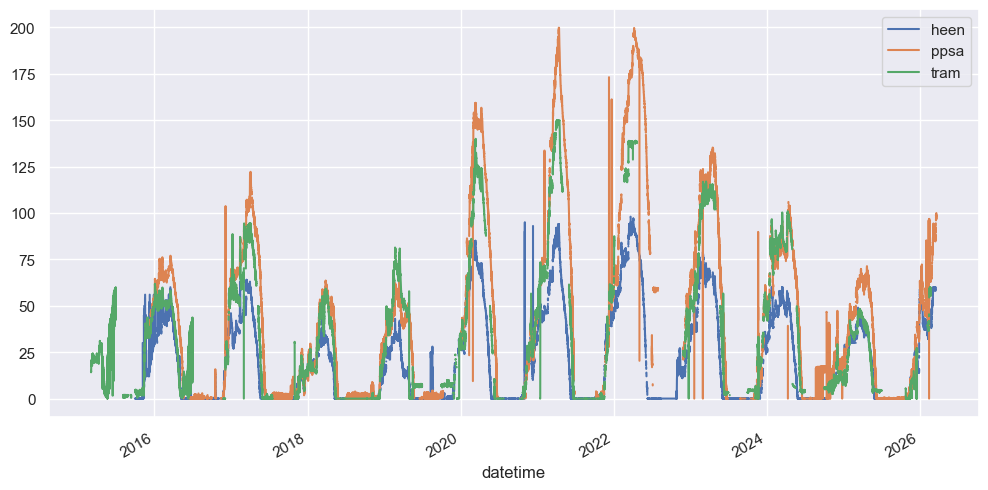

In [24]:
df_snow.drop(columns=['WY'], inplace=True)
df_snow.plot()

Text(0, 0.5, 'snow depth (in)')

<Figure size 1500x500 with 0 Axes>

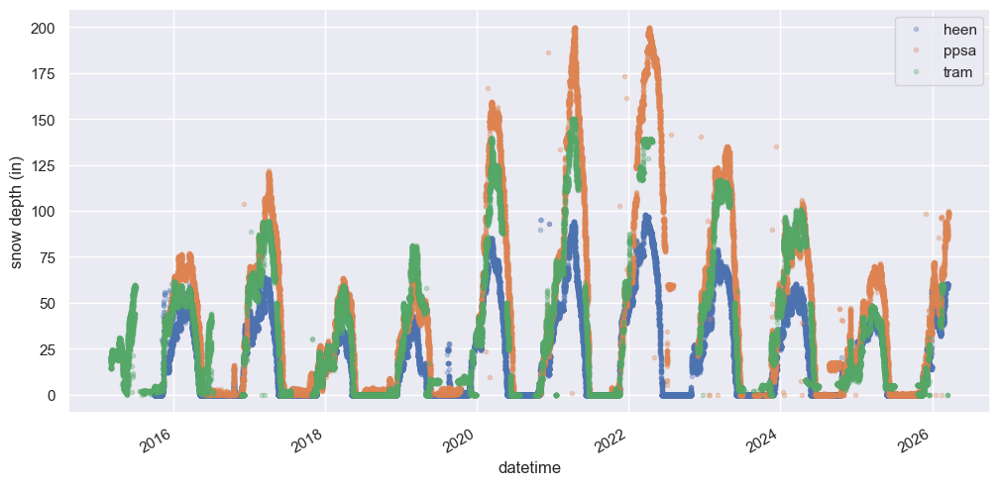

In [25]:
# figure size 
plt.figure(figsize=(15, 5))
df_snow.plot(marker='.', linestyle='None', alpha=0.3)
plt.ylabel('snow depth (in)')

### LOWESS Smoothing

In [26]:
import statsmodels.api as sm
from statsmodels.nonparametric.smoothers_lowess import lowess

In [27]:
df_snow_smooth = df_snow.copy()

# Set smoothing fraction (adjust 0.02–0.05 for more/less smoothing)
# frac = 0.02
frac = 0.005

# Apply LOWESS smoothing to each variable
lowess_heen = lowess(df_snow_smooth['heen'], df_snow_smooth.index.values, frac=frac, return_sorted=False)
lowess_ppsa = lowess(df_snow_smooth['ppsa'], df_snow_smooth.index.values, frac=frac, return_sorted=False)
lowess_tram = lowess(df_snow_smooth['tram'], df_snow_smooth.index.values, frac=frac, return_sorted=False)

# Add to dataframe
df_snow_smooth['heen_smooth'] = lowess_heen
df_snow_smooth['ppsa_smooth'] = lowess_ppsa
df_snow_smooth['tram_smooth'] = lowess_tram

# Replace negative smoothed values with NaN
df_snow_smooth.loc[df_snow_smooth['heen_smooth'] < 0, 'heen_smooth'] = np.nan
df_snow_smooth.loc[df_snow_smooth['ppsa_smooth'] < 0, 'ppsa_smooth'] = np.nan
df_snow_smooth.loc[df_snow_smooth['tram_smooth'] < 0, 'tram_smooth'] = np.nan

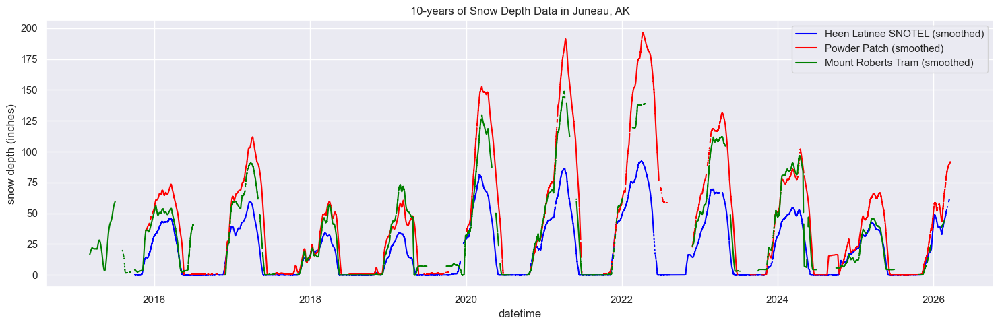

In [28]:
# Plot comparison
plt.figure(figsize=(15, 5))
# plt.plot(df_snow_smooth.index, df_snow_smooth['heen'], color='lightgray', label='Heen Latinee SNOTEL (raw)')
plt.plot(df_snow_smooth.index, df_snow_smooth['heen_smooth'], color='blue', label='Heen Latinee SNOTEL (smoothed)')
# plt.plot(df_snow_smooth.index, df_snow_smooth['ppsa'], color='lightpink', label='Powder Patch (raw)')
plt.plot(df_snow_smooth.index, df_snow_smooth['ppsa_smooth'], color='red', label='Powder Patch (smoothed)')
# plt.plot(df_snow_smooth.index, df_snow_smooth['tram'], color='lightgreen', label='Mount Roberts Tram (raw)')
plt.plot(df_snow_smooth.index, df_snow_smooth['tram_smooth'], color='green', label='Mount Roberts Tram (smoothed)')

plt.legend()
plt.title('10-years of Snow Depth Data in Juneau, AK')
plt.xlabel("datetime")
plt.ylabel("snow depth (inches)")
plt.tight_layout()
plt.show()

In [29]:
## previously dropping things just for plotting, 
# # drop any data after Sept 2025
# df_snow_smooth = df_snow_smooth[df_snow_smooth.index < '2026-10-01']

# # drop any data before Oct 2015
# df_snow_smooth = df_snow_smooth[df_snow_smooth.index >= '2015-10-01']

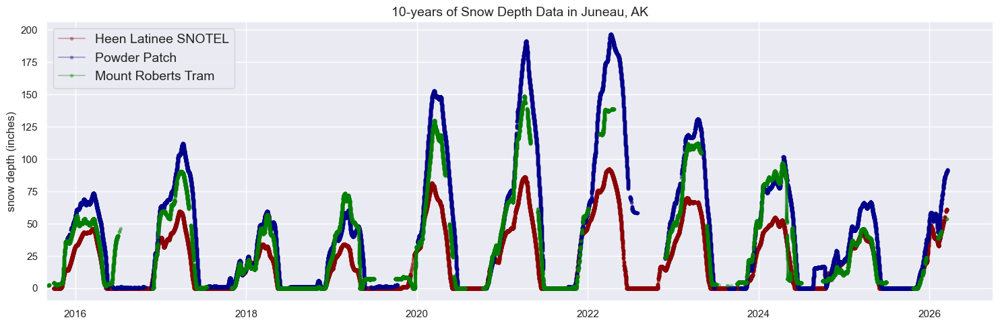

In [30]:
# Plot comparison
plt.figure(figsize=(15, 5))

plt.plot(df_snow_smooth.index, df_snow_smooth['heen_smooth'], color='darkred', label='Heen Latinee SNOTEL', marker='.', alpha=0.3)
plt.plot(df_snow_smooth.index, df_snow_smooth['ppsa_smooth'], color='darkblue', label='Powder Patch', marker='.', alpha=0.3)
plt.plot(df_snow_smooth.index, df_snow_smooth['tram_smooth'], color='green', label='Mount Roberts Tram', marker='.', alpha=0.3)

plt.legend(loc='upper left', fontsize='14')
plt.title('10-years of Snow Depth Data in Juneau, AK', fontsize='14')
plt.xlabel('')
plt.ylabel("snow depth (inches)")
# add tick marks to every single year 

plt.xlim(pd.Timestamp('2015-09-01'), pd.Timestamp('2026-10-01'))

plt.tight_layout()
plt.show()

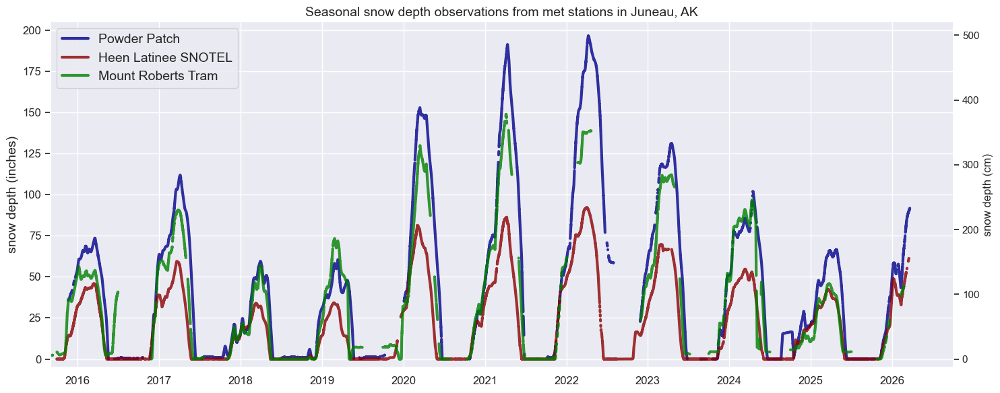

In [31]:
# Plot comparison
plt.figure(figsize=(15, 6))

plt.plot(df_snow_smooth.index, df_snow_smooth['ppsa_smooth'], color='darkblue', label='Powder Patch', linewidth=3, alpha=0.8)
plt.plot(df_snow_smooth.index, df_snow_smooth['heen_smooth'], color='darkred', label='Heen Latinee SNOTEL', linewidth=3, alpha=0.8)
plt.plot(df_snow_smooth.index, df_snow_smooth['tram_smooth'], color='green', label='Mount Roberts Tram', linewidth=3, alpha=0.8)

plt.legend(loc='upper left', fontsize='14')
plt.title('Seasonal snow depth observations from met stations in Juneau, AK', fontsize='14')
plt.xlabel('')
plt.ylabel("snow depth (inches)", fontsize='14')

# increase tickmark label size 
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

plt.ylim(-5, 205)
# add tick marks for every year 
plt.xticks(pd.date_range(start='2015-01-01', end='2026-12-31', freq='YS'))

# add a y-axis on the left side of the plot to show this in centimeters
ax2 = plt.gca().twinx()
ax2.set_ylabel('snow depth (cm)')
ax2.set_ylim(-5 * 2.54, 205 * 2.54)  # convert max inches to cm for y-axis limit

# but remove the gridlines from the secondary y-axis
ax2.grid(False)

# select date range for the xaxis
plt.xlim(pd.Timestamp('2015-09-01'), pd.Timestamp('2026-10-01'))

# keep the yaxis limit to 205 inches 


plt.tight_layout()
plt.show()

In [32]:
# save the df_snow_smooth dataframe to a csv file
df_snow_smooth.to_csv('/home/cassie/python/repos/snowdepth_teleconnections/snow_depth_ppsa_tram_heen_2015_2026.csv')

In [33]:
df_snow_smooth.head()

,heen,ppsa,tram,heen_smooth,ppsa_smooth,tram_smooth
datetime,,,,,,
2014-01-09 15:30:00,NaN,NaN,NaN,NaN,NaN,NaN
2014-01-09 16:00:00,NaN,NaN,NaN,NaN,NaN,NaN
2014-01-09 16:30:00,NaN,NaN,NaN,NaN,NaN,NaN
2014-01-09 17:00:00,NaN,NaN,NaN,NaN,NaN,NaN
2014-01-09 17:30:00,NaN,NaN,NaN,NaN,NaN,NaN
